# Rain Prediction in Australia using Artificial Neural Network (ANN)


In [98]:
import numpy as np
import pandas as pd
import missingno as m
import tensorflow as tf

# Reading Dataset

In [99]:
df=pd.read_csv("weatherAUS.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [100]:
df.shape

(145460, 23)

In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [102]:
df.describe().style.background_gradient(cmap = 'Greens')

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.000000,130432.000000,89572.000000,86102.000000,143693.000000,141851.000000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.649940,1015.255889,4.447461,4.509930,16.990631,21.683390
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.106530,7.037414,2.887159,2.720357,6.488753,6.936650
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


# Data Cleaning

<AxesSubplot:>

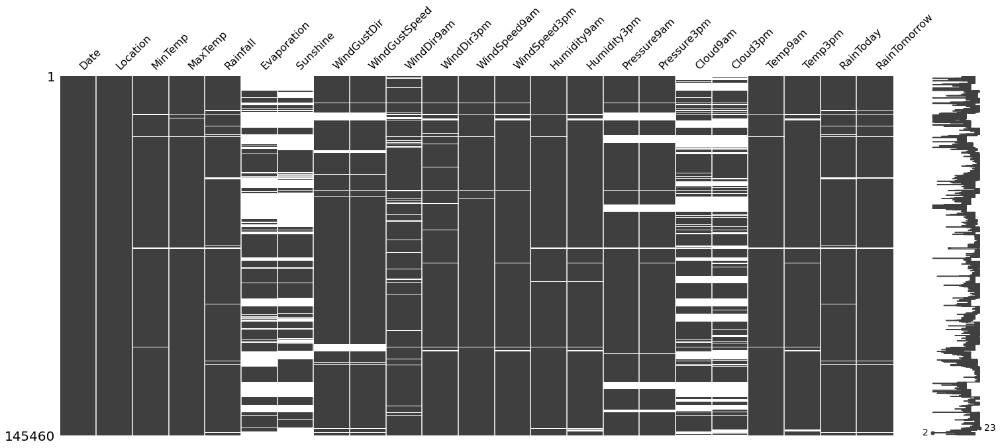

In [103]:
m.matrix(df)

In [104]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

## Filling the empty values with median 

In [105]:
df['MinTemp'].fillna(df['MinTemp'].median(), inplace=True)
df['MaxTemp'].fillna(df['MaxTemp'].median(), inplace=True)
df['Rainfall'].fillna(df['Rainfall'].median(), inplace=True)
df['Evaporation'].fillna(df['Evaporation'].median(), inplace=True)
df['Sunshine'].fillna(df['Sunshine'].median(), inplace=True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].median(), inplace=True)
df['WindSpeed9am'].fillna(df['WindSpeed9am'].median(), inplace=True)
df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].median(), inplace=True)
df['Humidity9am'].fillna(df['Humidity9am'].median(), inplace=True)
df['Humidity3pm'].fillna(df['Humidity3pm'].median(), inplace=True)
df['Pressure9am'].fillna(df['Pressure9am'].median(), inplace=True)
df['Pressure3pm'].fillna(df['Pressure3pm'].median(), inplace=True)
df['Cloud9am'].fillna(df['Cloud9am'].median(), inplace=True)
df['Cloud3pm'].fillna(df['Cloud3pm'].median(), inplace=True)
df['Temp9am'].fillna(df['Temp9am'].median(), inplace=True)
df['Temp3pm'].fillna(df['Temp3pm'].median(), inplace=True)



In [106]:
df.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      10326
WindGustSpeed        0
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday         3261
RainTomorrow      3267
dtype: int64

In [107]:
df = df.dropna()

<AxesSubplot:>

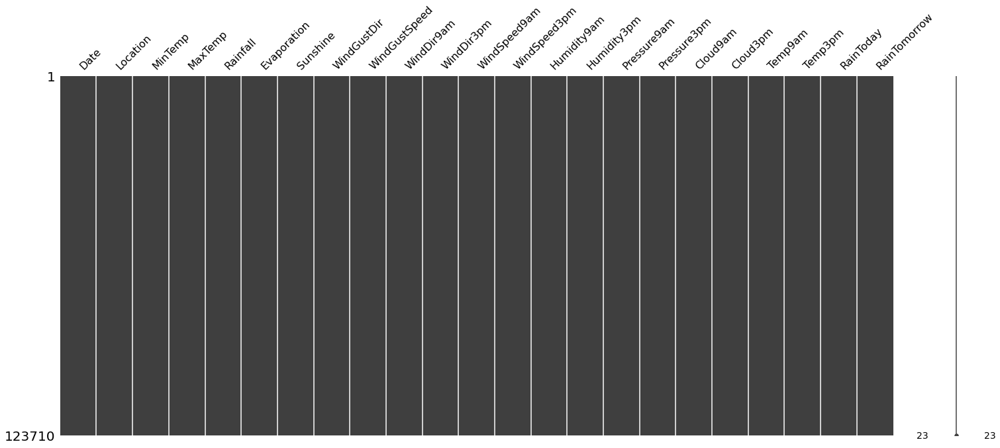

In [108]:
m.matrix(df)

# Data Analysis

In [109]:
import plotly.express as px

fig = px.histogram(df, x="RainToday",color='RainTomorrow',title='Target variables Rain Today and Rain Tomorrow Plot')
fig.show()

In [116]:
fig = px.histogram(df, x="Location",color = 'RainToday',title='Rain Today with respect to Location')
fig.show()

In [117]:
fig = px.histogram(df, x="Location",color = 'RainTomorrow',title='Rain Tomorrow with respect to Location')
fig.show()

In [147]:
fig = px.scatter(x=df['MaxTemp'], y=df['MinTemp'],color=df['Rainfall'],title='Rainfall depends on MaxTemp and MinTemp')
fig.show()

# Heatmap

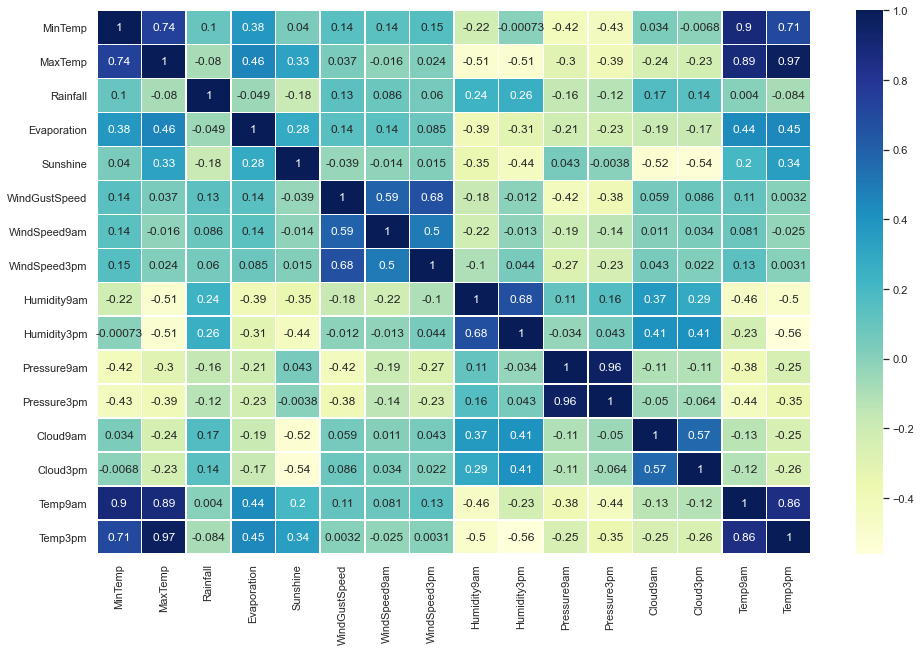

In [144]:

plt.figure(figsize = (16, 10))
sns.heatmap(df.corr(), annot = True,linewidths=.5, cmap="YlGnBu")
plt.show()

In [44]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.8,8.4,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.8,8.4,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,4.8,8.4,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.8,8.4,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## Dropping the date Column

In [45]:
df = df.drop(columns=['Date'])

In [46]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,4.8,8.4,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,4.8,8.4,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,4.8,8.4,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,4.8,8.4,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,4.8,8.4,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Laben Encoder for Categorical Data

In [47]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Location'] = le.fit_transform(df['Location'])
df['WindGustDir'] = le.fit_transform(df['WindGustDir'])
df['WindDir9am'] = le.fit_transform(df['WindDir9am'])
df['WindDir3pm'] = le.fit_transform(df['WindDir3pm'])
df['RainToday'] = le.fit_transform(df['RainToday'])
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])

In [48]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,4.8,8.4,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1,7.4,25.1,0.0,4.8,8.4,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,1,12.9,25.7,0.0,4.8,8.4,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,1,9.2,28.0,0.0,4.8,8.4,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,1,17.5,32.3,1.0,4.8,8.4,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


In [49]:
df1=df

# X and y Split

In [50]:
X = df1.iloc[:, :-2].values
y = df1.iloc[:, -2:].values

In [51]:
X

array([[ 1. , 13.4, 22.9, ...,  5. , 16.9, 21.8],
       [ 1. ,  7.4, 25.1, ...,  5. , 17.2, 24.3],
       [ 1. , 12.9, 25.7, ...,  2. , 21. , 23.2],
       ...,
       [39. ,  3.6, 25.3, ...,  5. , 10.9, 24.5],
       [39. ,  5.4, 26.9, ...,  5. , 12.5, 26.1],
       [39. ,  7.8, 27. , ...,  2. , 15.1, 26. ]])

In [52]:
y

array([[0, 0],
       [0, 0],
       [0, 0],
       ...,
       [0, 0],
       [0, 0],
       [0, 0]])

# Train Test Split

In [53]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Feature Scaling

In [54]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Building an Artificial Neural Network Model

## The ANN Architecture contains
### 1 Input Layer 
### 6 Hidden Layers
### 1 Output Layer

In [55]:
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units=20, activation='relu'))
ann.add(tf.keras.layers.Dense(units=15, activation='relu'))
ann.add(tf.keras.layers.Dense(units=35, activation='relu'))
ann.add(tf.keras.layers.Dense(units=50, activation='relu'))
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))
ann.add(tf.keras.layers.Dense(units=5, activation='relu'))
ann.add(tf.keras.layers.Dense(units=2, activation='sigmoid'))

## Using ADAGRAD optimizer and loss function be Binary_Crossentropy

In [56]:
ann.compile(optimizer = 'adagrad', loss = 'binary_crossentropy', metrics = ['accuracy'])

## Running 100 Epochs

In [81]:
history = ann.fit(X_train, y_train, batch_size = 32, epochs = 100)

Epoch 1/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1882 - accuracy: 0.3515
Epoch 2/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1882 - accuracy: 0.3511
Epoch 3/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1881 - accuracy: 0.3515
Epoch 4/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1881 - accuracy: 0.3511
Epoch 5/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1880 - accuracy: 0.3512
Epoch 6/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1880 - accuracy: 0.3513
Epoch 7/100
3093/3093 [==============================] - 3s 1ms/step - loss: 0.1879 - accuracy: 0.3513: 0s - loss: 0.1872 
Epoch 8/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1879 - accuracy: 0.3514
Epoch 9/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1879 - accuracy: 0.3514: 1s - loss: 0 - ETA: 0s - loss:
Epoch 10/100
3093/309

3093/3093 [==============================] - 4s 1ms/step - loss: 0.1854 - accuracy: 0.3492
Epoch 77/100
3093/3093 [==============================] - 5s 2ms/step - loss: 0.1854 - accuracy: 0.3494
Epoch 78/100
3093/3093 [==============================] - 5s 2ms/step - loss: 0.1853 - accuracy: 0.3492
Epoch 79/100
3093/3093 [==============================] - 5s 1ms/step - loss: 0.1853 - accuracy: 0.3491
Epoch 80/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1853 - accuracy: 0.3490
Epoch 81/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1852 - accuracy: 0.3492
Epoch 82/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1852 - accuracy: 0.3492
Epoch 83/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1852 - accuracy: 0.3489
Epoch 84/100
3093/3093 [==============================] - 4s 1ms/step - loss: 0.1851 - accuracy: 0.3489
Epoch 85/100
3093/3093 [==============================] - 4s 1ms/step - loss:

## prediction for test case

In [82]:
y_pred = ann.predict(X_test)
y_pred = (y_pred > 0.5)

## Converting Boolean to Binary

In [83]:
y_pred = np.where(y_pred == 'False',0, y_pred)

C:\Users\KIIT\Anaconda3\envs\python 36 with tensorflow\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """Entry point for launching an IPython kernel.


In [84]:
y_pred

array([[0, 0],
       [0, 0],
       [0, 0],
       ...,
       [0, 0],
       [0, 0],
       [1, 1]])

## Actual vs Predicted Data

In [86]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

d = np.concatenate((y_pred.reshape(len(y_pred),2), y_test.reshape(len(y_test),2)),1)
print(d)

[[0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 ...
 [0 0 0 0]
 [0 0 0 0]
 [1 1 1 0]]


# Accuracy

In [146]:
from sklearn.metrics import accuracy_score

print("Accuracy : ",accuracy_score(y_test, y_pred))

Accuracy :  0.8445962331258589


In [88]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      5571
           1       0.72      0.52      0.61      5461

   micro avg       0.88      0.76      0.81     11032
   macro avg       0.85      0.75      0.80     11032
weighted avg       0.86      0.76      0.80     11032
 samples avg       0.25      0.25      0.24     11032



## This Model can Successfully Predict the Chance of rain on Today and Tomorrow with an Accuracy of 84.4%

# This Model can be used to Check the Probability of Rain on the Current Day and Next Day